# ICTP_Mosquito_WingBeat_Sound_Classification_TinyML
- Raw data: Sample Rate: 16 KHz / 16 bits
- TinyML - Dataset Preparation
- M.Rovai @30Nov2021

## Libraries 

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import soundfile
import librosa
import librosa.display
import IPython.display

## Classes
* Aedes aegypti
* Aedes albopictus
* Other mosquitos
* Noise


## Download Datasets

### Raw Dataset (Stanford University)
- [Data from: Using mobile phones as acoustic sensors for high-throughput mosquito surveillance](https://datadryad.org/stash/dataset/doi:10.5061/dryad.98d7s)

The direct monitoring of mosquito populations in field settings is a crucial input for shaping appropriate and timely control measures for mosquito-borne diseases. Here, we demonstrate that commercially available mobile phones are a powerful tool for acoustically mapping mosquito species distributions worldwide. We show that even low-cost mobile phones with very basic functionality are capable of sensitively acquiring acoustic data on species-specific mosquito wingbeat sounds, while simultaneously recording the time and location of the human-mosquito encounter. We survey a wide range of medically important mosquito species, to quantitatively demonstrate how acoustic recordings supported by spatio-temporal metadata enable rapid, non-invasive species identification. As proof-of-concept, we carry out field demonstrations where minimally-trained users map local mosquitoes using their personal phones. Thus, we establish a new paradigm for mosquito surveillance that takes advantage of the existing global mobile network infrastructure, to enable continuous and large-scale data acquisition in resource-constrained areas.

Mukundarajan, Haripriya et al. (2018), Data from: Using mobile phones as acoustic sensors for high-throughput mosquito surveillance, Dryad, Dataset, https://doi.org/10.5061/dryad.98d7s

The 2 main classes will be the `Aedes aegypi` and `Aedes albopictus`. All 44KHz data will be used.

### Background noise

- Record form laboratory (Santiago and Trieste)
- Extract from Speech Commands v0.02 dataset 
- Get background from Mukundarajan, Haripriya et al. (2018), Data from: Using mobile phones as acoustic sensors for high-throughput mosquito surveillance, Dryad, Dataset, https://doi.org/10.5061/dryad.98d7s

### Other mosquitos
`Other Mosquito` is a random sampling from the "Using mobile phones as acoustic sensors for high-throughput mosquito surveillance, Dryad, Dataset", except for `Aedes aegypt` and `Aedes albopictu`. 

### Working Dataset

In [6]:
!pwd

/Users/mjrovai/Dropbox/2021/50_TinyML/ICTP/30_ICTP_Mosquito_WingBeat_Sound_Classification_TinyML/notebooks


In [15]:
!ls ../data/raw_dataset

aedes_aegypti    aedes_albopictus noise            other_mosquitos


#### inspect data

In [18]:
!ls ../data/raw_dataset/aedes_aegypti

10130f.wav                   11-16-2016-111839 10130f.wav
11-16-2016-111457 10130f.wav


In [19]:
file_path = '../data/raw_dataset/aedes_aegypti/'
file = '10130f.wav'
audio, sr = librosa.load(file_path+file, sr=16000) # Read in 16kHz

In [20]:
sr

16000

In [21]:
audio.shape

(4702320,)

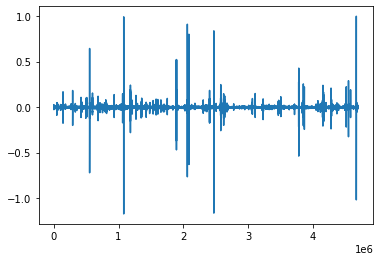

In [22]:
plt.plot(audio);

In [23]:
IPython.display.Audio(data=audio, rate=sr)

In [37]:
len_min = (len(audio)/16000)/60
cut = int(len_min)
cut

4

In [50]:
x = np.array_split(audio, cut)

In [51]:
len(x[3])

1175580

####  Convert to 16KHz/16bit and save data as .wav (around 1 minute samples)

In [52]:
def split_resample_audio(file_path, saved_file_path, file):
    audio, sr = librosa.load(file_path+file, sr=16000) # Read in 16kHz
    len_min = (len(audio)/sr)/60
    cut = int(len_min)
    if cut == 0:cut=1
    split_audio = np.array_split(audio, cut)
    for i in range(cut):
        soundfile.write(saved_file_path+'16khz_'+str(i)+'_'+file, split_audio[i], sr, subtype='PCM_16')

**aedes_aegypti**

In [54]:
!ls ../data/raw_dataset/aedes_aegypti

10130f.wav                   11-16-2016-111839 10130f.wav
11-16-2016-111457 10130f.wav


In [2]:
f1=2*60+32
f2=4*60+6
f3=4*60+54
(f1+f2+f3)/60

11.533333333333333

In [55]:
file = '10130f.wav'
file_path = '../data/raw_dataset/aedes_aegypti/'
saved_file_path = '../data/dataset/aedes_aegypti/'
split_resample_audio(file_path, saved_file_path, file)

In [53]:
file = '11-16-2016-111839 10130f.wav'
file_path = '../data/raw_dataset/aedes_aegypti/'
saved_file_path = '../data/dataset/aedes_aegypti/'
split_resample_audio(file_path, saved_file_path, file)

In [56]:
file = '11-16-2016-111457 10130f.wav'
file_path = '../data/raw_dataset/aedes_aegypti/'
saved_file_path = '../data/dataset/aedes_aegypti/'
split_resample_audio(file_path, saved_file_path, file)

**aedes_albopictus**

In [57]:
!ls ../data/raw_dataset/aedes_albopictus

11-16-2016-125240 albopictus f.wav albof.wav


In [3]:
f1=5*60+27
f2=5*60+40
(f1+f2)/60

11.116666666666667

In [60]:
file = '11-16-2016-125240 albopictus f.wav'
file_path = '../data/raw_dataset/aedes_albopictus/'
saved_file_path = '../data/dataset/aedes_albopictus/'
split_resample_audio(file_path, saved_file_path, file)

In [61]:
file = 'albof.wav'
file_path = '../data/raw_dataset/aedes_albopictus/'
saved_file_path = '../data/dataset/aedes_albopictus/'
split_resample_audio(file_path, saved_file_path, file)

**background noise**

In [81]:
from pathlib import Path

file_path = '../data/raw_dataset/noise/' 
saved_file_path = '../data/dataset/noise/' 

entries = Path(file_path)
for entry in entries.iterdir():
    file = entry.name
    audio, sr = librosa.load(file_path+file, sr=16000) # Read in 16kHz
    soundfile.write(saved_file_path+'16khz_'+file, audio, sr, subtype='PCM_16')        
    print(file)

Background copy 8.wav
Background.wav
Background copy 2.wav
Background copy 3.wav
Background copy.wav
Background copy 7.wav
Background copy 6.wav
Background copy 4.wav
Background copy 5.wav


In [4]:
9*21/60

3.15

In [98]:
file_path = '../data/raw_dataset/noise/' 
saved_file_path = '../data/dataset/noise/' 

entries = Path(file_path)
for entry in entries.iterdir():
    try:
        file = entry.name
        audio, sr = librosa.load(file_path+file, sr=16000) # Read in 16kHz
        len_min = (len(audio)/sr)/60
        cut = int(len_min)
        if cut == 0:cut=1
        split_audio = np.array_split(audio, cut)
        for i in range(cut):
            soundfile.write(saved_file_path+'16khz_'+str(i)+'_'+file, split_audio[i], sr, subtype='PCM_16')        
        print(file)
    except:
        print("Problem with: ", file)

Background copy 8.wav
Background.wav
noise.26Nov21.wav
Background copy 2.wav
Background copy 3.wav
Background copy.wav
Background copy 7.wav
Background copy 6.wav
Background copy 4.wav
Background copy 5.wav


**Other Mosquitos**

- The samples were split around 1 minute and converted. 
- A sub-sample of around 22 minutes were selected to be uploaded to Edge Impulse

In [96]:
int(0.8)

0

In [97]:
file_path = '../data/raw_dataset/other_mosquitos/' 
saved_file_path = '../data/dataset/other_mosquitos/' 

entries = Path(file_path)
for entry in entries.iterdir():
    try:
        file = entry.name
        audio, sr = librosa.load(file_path+file, sr=16000) # Read in 16kHz
        len_min = (len(audio)/sr)/60
        cut = int(len_min)
        if cut == 0:cut=1
        split_audio = np.array_split(audio, cut)
        for i in range(cut):
            soundfile.write(saved_file_path+'16khz_'+str(i)+'_'+file, split_audio[i], sr, subtype='PCM_16')        
        print(file)
    except:
        print("Problem with: ", file)

/Users/mjrovai/opt/anaconda3/envs/Tf2_Py37/lib/python3.7/site-packages/librosa/core/audio.py:162: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn("PySoundFile failed. Trying audioread instead.")


Problem with:  .DS_Store
11-18-2016-145016 rsp f.wav
Cxq 2.wav
11-18-2016-105358 sanqua.wav
Afar5.wav
11-11-2016-151731 quadri.wav
ag4.wav
Big Black Mosquito Glen Park - March 2016 - DS4.wav
Voice0156 dongolaf.wav
am5.wav
am4.wav
akronf.wav
P2.wav
asf1.wav
CxT F (4).wav
20160302 154329AdM.wav
Rec_1980-02-16_15.56.16afar.wav
